In [35]:
%pip install numpy matplotlib

Note: you may need to restart the kernel to use updated packages.


In [36]:
import numpy as np
import matplotlib as plt
import cv2

Numer_indeksu % liczba_zdjęć = x

In [37]:
nr_zdj = 335201 % 36
print("numer zdjęcia po losowaniu: ", nr_zdj)

numer zdjęcia po losowaniu:  5


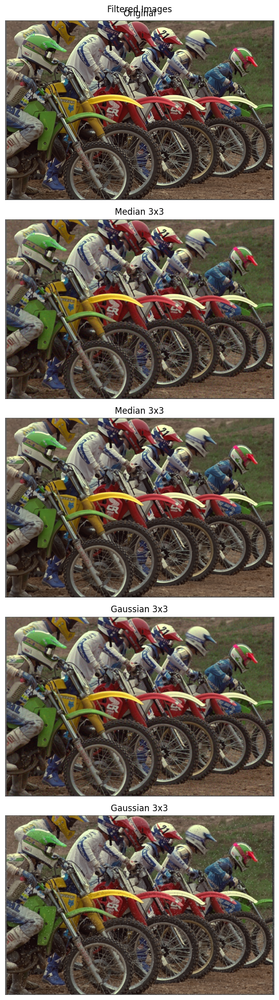

Image saved to ../LAB_4/results/original_image0_3.png
Image saved to ../LAB_4/results/median_image0_3.png
Image saved to ../LAB_4/results/median_image1_3.png
Image saved to ../LAB_4/results/gaussian_image0_3.png
Image saved to ../LAB_4/results/gaussian_image1_3.png


In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Funkcja do wyświetlania listy obrazów w pionowym układzie, jeden pod drugim, w notebooku.
def cv_imshow(img_list, img_titles, figure_title=""):
    plt.figure(figsize=(10, 20))  # Ustawienie rozmiaru figury dla wyświetlanych obrazów.
    plt.suptitle(figure_title)  # Ustawienie głównego tytułu dla całej figury.
    for i, (img, title) in enumerate(zip(img_list, img_titles), 1):
        plt.subplot(len(img_list), 1, i)  # Tworzenie osobnego subplota dla każdego obrazu.
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Konwersja kolorów z BGR (OpenCV) na RGB (matplotlib).
        plt.title(title)  # Dodanie tytułu do każdego obrazu.
        plt.axis('off')  # Wyłączenie osi (numery i linie) dla czystszego wyglądu.
    plt.tight_layout()  # Automatyczne dopasowanie podwykresów, aby lepiej pasowały do figury.
    plt.show()

def readImages():
    # Wczytanie i zwrócenie oryginalnego obrazu oraz obrazów z różnymi rodzajami szumów.
    original_image = cv2.imread("../LAB_4/obrazy_testowe/color/bikes_col.png")
    gaussian_noise_image = cv2.imread("../LAB_4/obrazy_testowe/color_noise/bikes_col_noise.png")
    impulse_noise_image = cv2.imread("../LAB_4/obrazy_testowe/color_inoise1/bikes_col_inoise.png")
    return original_image, gaussian_noise_image, impulse_noise_image

# Funkcja do aplikowania filtru medianowego na listę obrazów.
def medianFilter(images, kernel_size):
    median_images = []
    for i in range(1, len(images)):
        # Aplikacja filtru medianowego na każdy obraz (oprócz oryginalnego).
        image = cv2.medianBlur(images[i], kernel_size)
        median_images.append(image)
    return median_images

# Funkcja do aplikowania filtru gaussowskiego na listę obrazów.
def gaussianFilter(images, kernel_size):
    gaussian_images = []
    for i in range(1, len(images)):
        # Aplikacja filtru gaussowskiego na każdy obraz (oprócz oryginalnego).
        image = cv2.GaussianBlur(images[i], (kernel_size, kernel_size), 0)
        gaussian_images.append(image)
    return gaussian_images

# Funkcja do zapisywania listy obrazów do plików.
def savePhotos(images, save_path, filter_name, kernel_size):
    if not os.path.exists(save_path):
        os.makedirs(save_path)  # Tworzenie katalogu wynikowego, jeśli nie istnieje.
    for index, image in enumerate(images):
        savepath = os.path.join(save_path, f"{filter_name}_image{index}_{kernel_size}.png")
        cv2.imwrite(savepath, image)  # Zapis obrazu do pliku.
        print(f"Image saved to {savepath}")

# Funkcja do obliczania PSNR między dwoma obrazami.
def calcPSNR(img1, img2):
    imax = 255.**2
    mse = ((img1.astype(np.float64) - img2)**2).sum() / img1.size
    return 10.0 * np.log10(imax / mse)

# Określenie rozmiaru jądra dla filtrów.
kernel_size = 3
# Wczytanie obrazów.
images = readImages()
# Ścieżka do zapisu wyników.
out_path = "../LAB_4/results/"

# Aplikacja filtrów na obrazy i zapis wyników.
median_images = medianFilter(images, kernel_size)
gaussian_images = gaussianFilter(images, kernel_size)

# Przygotowanie obrazów i tytułów do wyświetlenia
all_images = [images[0]] + median_images + gaussian_images
titles = ["Original"] + [f"Median {kernel_size}x{kernel_size}"] * len(median_images) 
+ [f"Gaussian {kernel_size}x{kernel_size}"] * len(gaussian_images)

cv_imshow(all_images, titles, "Filtered Images")

savePhotos([images[0]], out_path, "original", kernel_size)
savePhotos(median_images, out_path, "median", kernel_size)
savePhotos(gaussian_images, out_path, "gaussian", kernel_size)


In [47]:
import pandas as pd

# Inicjalizacja listy do przechowywania wyników PSNR.
psnr_results = []

kernel_sizes = [3, 5, 7]  # Definicja rozmiarów masek.

for kernel_size in kernel_sizes:
    median_images = medianFilter(images, kernel_size)
    gaussian_images = gaussianFilter(images, kernel_size)
    
    # Obliczenie PSNR dla obrazów po filtracji medianowej.
    for img in median_images:
        psnr = calcPSNR(images[0], img)
        psnr_results.append({'Filter': 'Median', 'Kernel Size': kernel_size, 'PSNR': psnr})
    
    # Obliczenie PSNR dla obrazów po filtracji gaussowskiej.
    for img in gaussian_images:
        psnr = calcPSNR(images[0], img)
        psnr_results.append({'Filter': 'Gaussian', 'Kernel Size': kernel_size, 'PSNR': psnr})

# Konwersja wyników PSNR do DataFrame dla łatwiejszej analizy i prezentacji.
psnr_df = pd.DataFrame(psnr_results)

# Wyświetlenie tabeli PSNR.
print(psnr_df)


      Filter  Kernel Size       PSNR
0     Median            3  26.830133
1     Median            3  27.288388
2   Gaussian            3  27.410793
3   Gaussian            3  25.859112
4     Median            5  23.233747
5     Median            5  23.321736
6   Gaussian            5  25.052023
7   Gaussian            5  24.461200
8     Median            7  21.820245
9     Median            7  21.859843
10  Gaussian            7  23.271935
11  Gaussian            7  23.014001


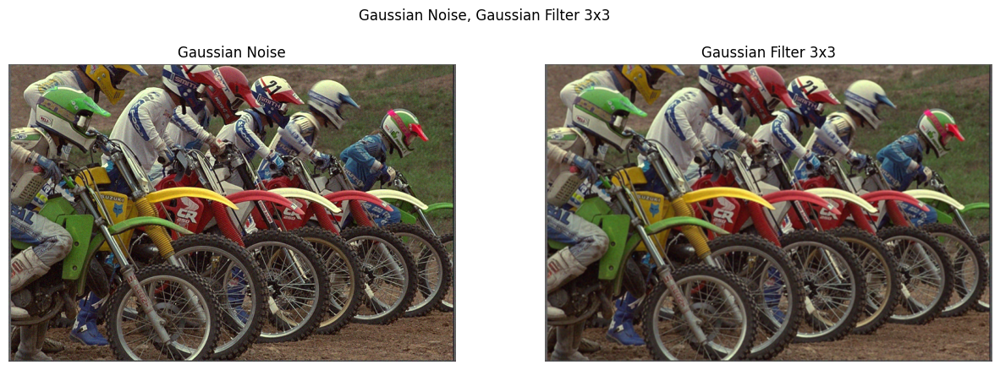

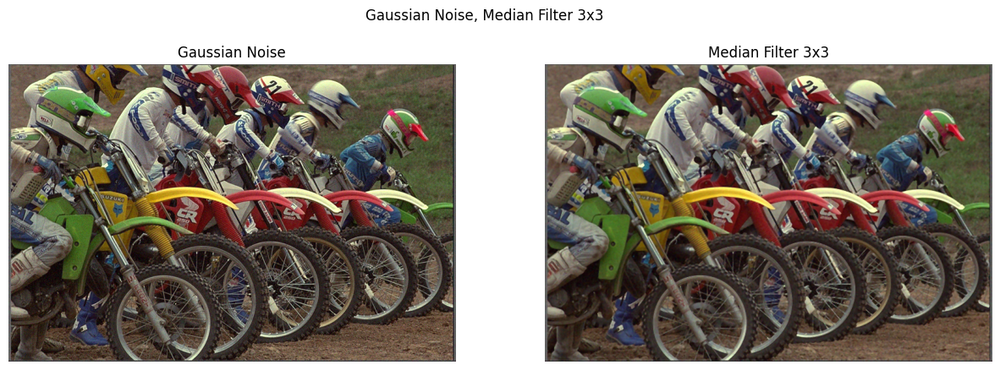

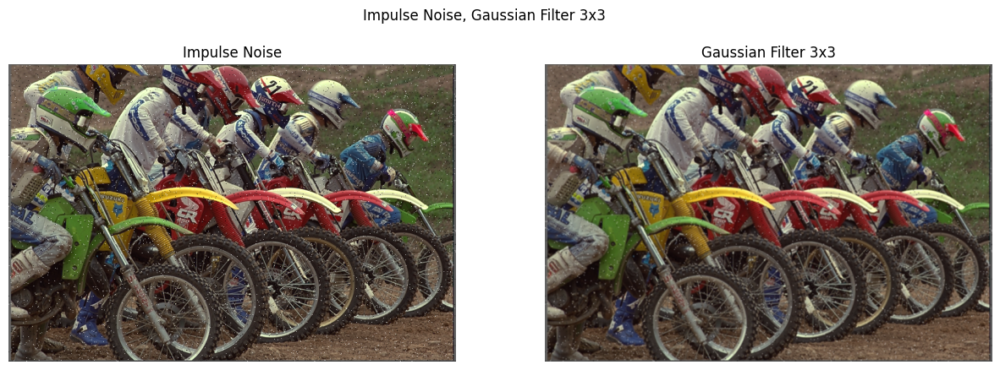

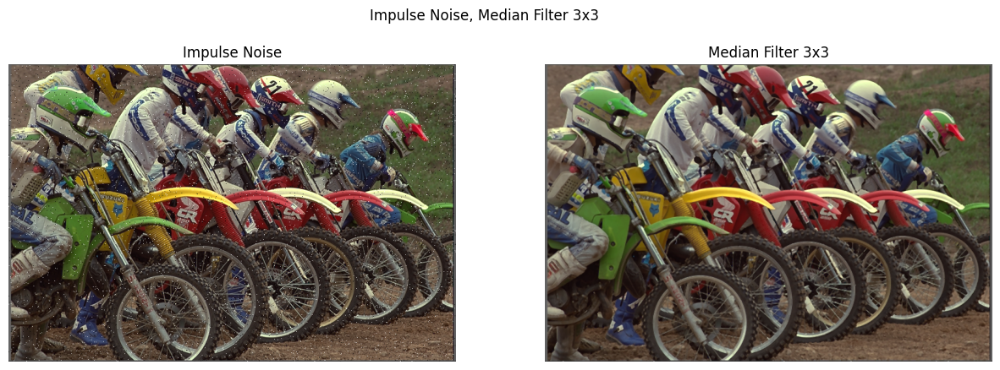

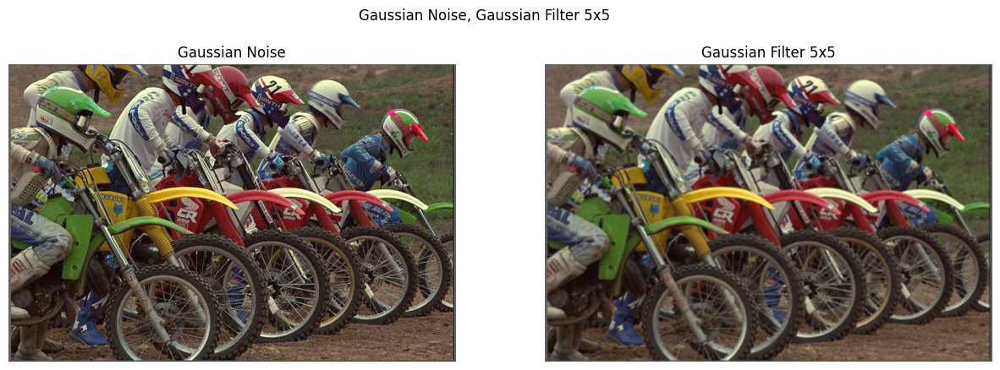

...

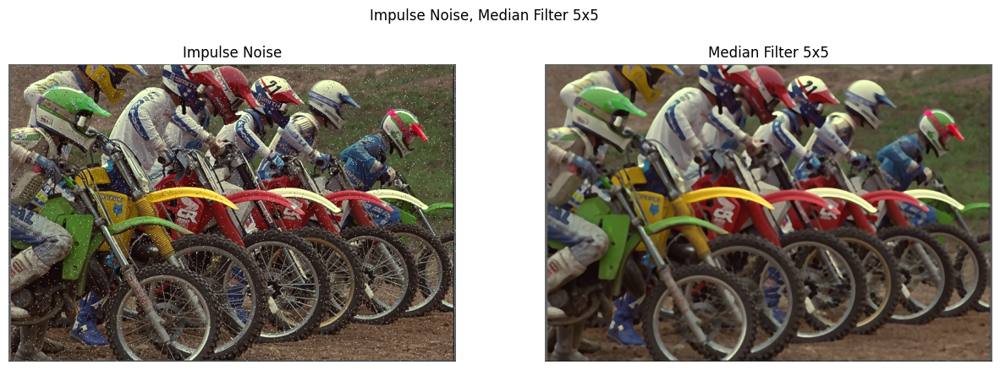

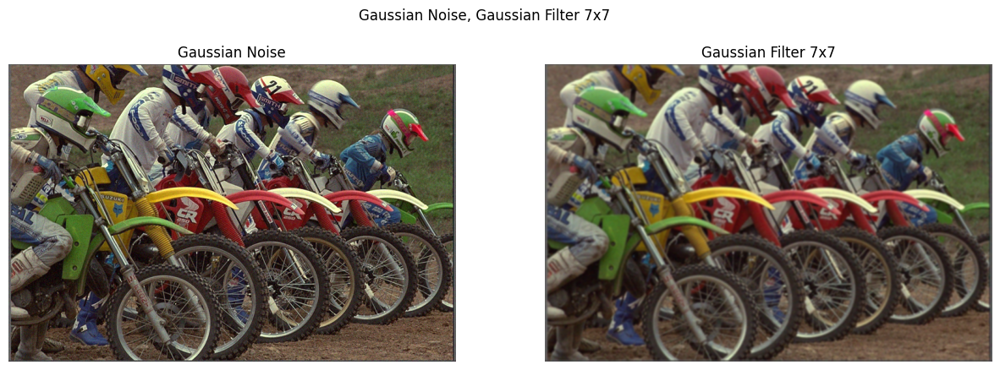

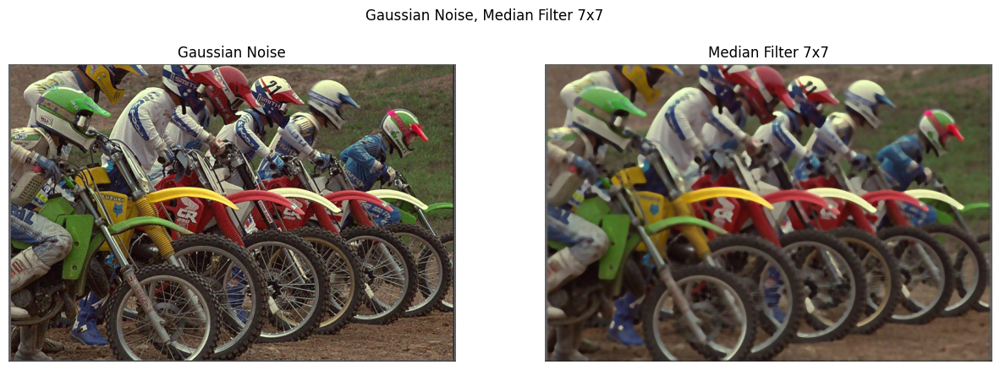

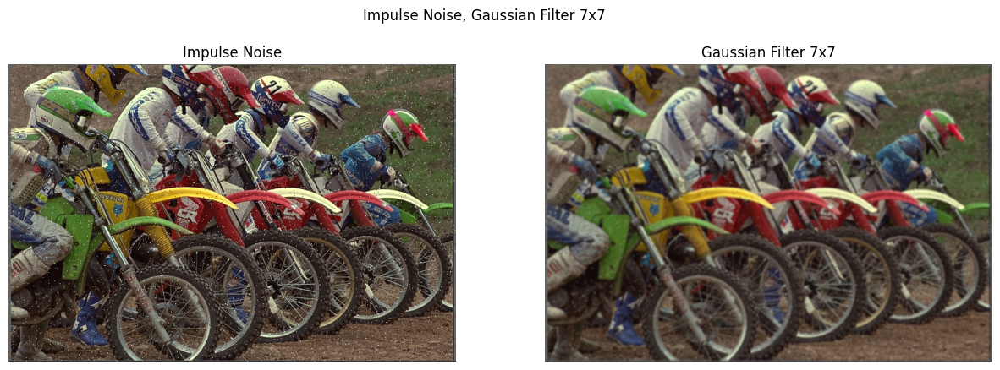

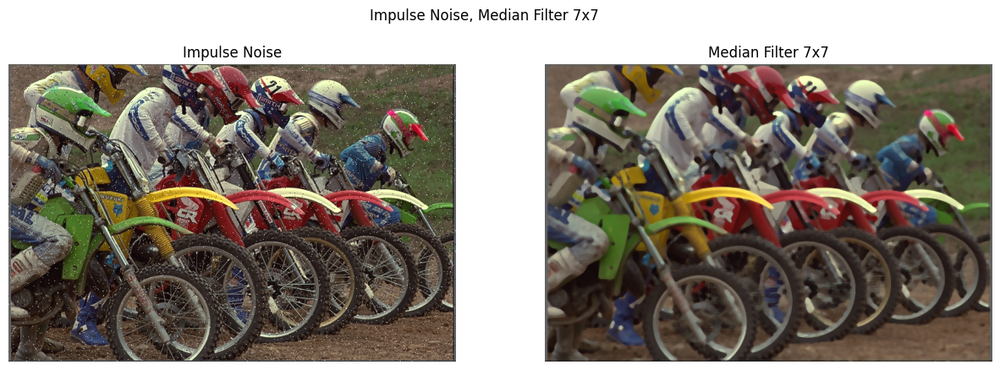

In [49]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Funkcje pomocnicze, założono że są już zdefiniowane:
# readImages, medianFilter, gaussianFilter, calcPSNR

# Wczytanie obrazów
original_image, gaussian_noise_image, impulse_noise_image = readImages()

# Definicja rozmiarów kerneli
kernel_sizes = [3, 5, 7]

# Definicja funkcji do wyświetlania wyników
def display_filter_results(images, titles, figure_title):
    n = len(images)
    plt.figure(figsize=(15, 5))
    plt.suptitle(figure_title)
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

# Iteracja przez rozmiary kerneli i wyświetlanie wyników dla każdej konfiguracji
for kernel_size in kernel_sizes:
    # Filtracja gaussowska na obrazie z szumem gaussowskim
    gaussian_filtered = cv2.GaussianBlur(gaussian_noise_image, (kernel_size, kernel_size), 0)
    # Filtracja medianowa na obrazie z szumem gaussowskim
    median_filtered_gaussian = cv2.medianBlur(gaussian_noise_image, kernel_size)
    # Filtracja gaussowska na obrazie z szumem impulsowym
    gaussian_filtered_impulse = cv2.GaussianBlur(impulse_noise_image, (kernel_size, kernel_size), 0)
    # Filtracja medianowa na obrazie z szumem impulsowym
    median_filtered_impulse = cv2.medianBlur(impulse_noise_image, kernel_size)
    
    # Tutaj dodaj wywołanie funkcji display_filter_results jak poprzednio

    
    # Wyświetlanie wyników
    display_filter_results([gaussian_noise_image, gaussian_filtered],
                           ['Gaussian Noise', f'Gaussian Filter {kernel_size}x{kernel_size}'],
                           f'Gaussian Noise, Gaussian Filter {kernel_size}x{kernel_size}')
    
    display_filter_results([gaussian_noise_image, median_filtered_gaussian],
                           ['Gaussian Noise', f'Median Filter {kernel_size}x{kernel_size}'],
                           f'Gaussian Noise, Median Filter {kernel_size}x{kernel_size}')
    
    display_filter_results([impulse_noise_image, gaussian_filtered_impulse],
                           ['Impulse Noise', f'Gaussian Filter {kernel_size}x{kernel_size}'],
                           f'Impulse Noise, Gaussian Filter {kernel_size}x{kernel_size}')
    
    display_filter_results([impulse_noise_image, median_filtered_impulse],
                           ['Impulse Noise', f'Median Filter {kernel_size}x{kernel_size}'],
                           f'Impulse Noise, Median Filter {kernel_size}x{kernel_size}')
